In [1]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import AxesGrid
import xarray as xr
import os
import numpy as np
import logging
import cmocean
import copy

cmocean.cm.balance
cmap = copy.copy(cmocean.cm.balance)
cmap.set_bad('gray')   
###first verage every year and then concate

pp_root_uncou = "/archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/postProcessing/NWA12.COBALTuncou/"
pp_root_uncou_LAfalse="/archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/postProcessing/NWA12.COBALTuncou_LALTFalse/"
pp_root_12_all="/archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/c6/postProcessing/NWA12_wave_all/"
pp_root_12_wave="/archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/c6/postProcessing/NWA12_wave/"
pp_root_6_all="/archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/c6/postProcessing/NWA12_6_all/"
pp_root_6_wave="/archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/c6/postProcessing/NWA12_6_wave/"
def read_and_compute_percentage_all(pp_root, data_list, variables, thresholds=[0.5, 1]):
    total_below_count = {threshold: {var: None for var in variables} for threshold in thresholds}
    total_time_count = {var: 0 for var in variables}  # To keep track of total time steps

    for file_path in data_list:
        file_path = os.path.join(pp_root, file_path)
        if os.path.exists(file_path):
            try:
                ds = xr.open_dataset(file_path)
                for var_name in variables:
                    if var_name in ds:
                        time_steps = ds.sizes['time']  # Get number of time steps in this file
                        total_time_count[var_name] += time_steps
                        
                        for threshold in thresholds:
                            below_threshold = (ds[var_name] <= threshold)
                            count = below_threshold.sum(dim='time')  # Sum occurrences over time
                            
                            if total_below_count[threshold][var_name] is None:
                                total_below_count[threshold][var_name] = count
                            else:
                                total_below_count[threshold][var_name] += count
                    else:
                        print(f"Variable {var_name} not found in {file_path}")
                ds.close()
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
        else:
            print(f"File not found: {file_path}")
    
    # Compute percentage occurrence for each grid point at both thresholds
    percentage_below_threshold = {
        threshold: {
            var: (total_below_count[threshold][var] / total_time_count[var]) * 100 if total_below_count[threshold][var] is not None else None
            for var in variables
        }
        for threshold in thresholds
    }
    
    return percentage_below_threshold
def read_and_extract_data_point(pp_root, data_list, variables,x_coord,y_coord):
    combined_data = {}
    summer_data = {}
    winter_data = {}

    for var_name in variables:
        datasets = []
        summer_data_list = []
        winter_data_list = []

        for file_path in data_list:
            file_path = os.path.join(pp_root, file_path)
            if os.path.exists(file_path):
                try:
                    ds = xr.open_dataset(file_path)
                    if var_name in ds:
                        
                      
                        
                        wave_time = ds[var_name].sel(xh=x_coord, yh=y_coord, method="nearest")
                        # exact_xh = wave_time.xh.values
                        # exact_yh = wave_time.yh.values
                        datasets.append(wave_time)
                        
                        # print(f"Exact xh: {exact_xh}, Exact yh: {exact_yh}")

                        # Summer: June, July, August (JJA)
                        summer = ds.sel(time=ds['time'].dt.month.isin([6, 7, 8]))
                        if not summer[var_name].isnull().all():
                            summer_mean = summer[var_name].sel(xh=x_coord, yh=y_coord, method="nearest")
                       
                            
                            summer_data_list.append(summer_mean)

                        # Winter: December, January, February (DJF)
                        winter = ds.sel(time=ds['time'].dt.month.isin([12, 1, 2]))
                        if not winter[var_name].isnull().all():
                            winter_mean=winter[var_name].sel(xh=x_coord, yh=y_coord, method="nearest")
                            winter_data_list.append(winter_mean)

                    else:
                        print(f"Variable {var_name} not found in {file_path}")
                    ds.close()

                except Exception as e:
                    print(f"Error reading {file_path}: {e}")
            else:
                print(f"File not found: {file_path}")

        # Combine along time dimension after the loop finishes
        combined_data[var_name] = xr.concat(datasets, dim='time') if datasets else None
        summer_data[var_name] = xr.concat(summer_data_list, dim='time') if summer_data_list else None
        winter_data[var_name] = xr.concat(winter_data_list, dim='time') if winter_data_list else None

    return combined_data, summer_data, winter_data
import os
import numpy as np
import xarray as xr

def read_and_compute_percentage(pp_root, data_list, variables, thresholds=[0.5, 1]):
    total_below_count = {season: {threshold: {var: None for var in variables} for threshold in thresholds} for season in ['all', 'summer', 'winter']}
    total_time_count = {season: {var: 0 for var in variables} for season in ['all', 'summer', 'winter']}

    for file_path in data_list:
        file_path = os.path.join(pp_root, file_path)
        if os.path.exists(file_path):
            try:
                ds = xr.open_dataset(file_path)
                summer = ds.sel(time=ds['time'].dt.month.isin([6, 7, 8]))
                winter = ds.sel(time=ds['time'].dt.month.isin([12, 1, 2]))
                
                for var_name in variables:
                    if var_name in ds:
                        datasets = {'all': ds, 'summer': summer, 'winter': winter}
                        
                        for season, dataset in datasets.items():
                            if 'time' in dataset.dims and dataset.sizes['time'] > 0:
                                time_steps = dataset.sizes['time']
                                total_time_count[season][var_name] += time_steps
                                
                                for threshold in thresholds:
                                    below_threshold = (dataset[var_name] <= threshold)
                                    count = below_threshold.sum(dim='time')  # Sum occurrences over time
                                    
                                    if total_below_count[season][threshold][var_name] is None:
                                        total_below_count[season][threshold][var_name] = count
                                    else:
                                        total_below_count[season][threshold][var_name] += count
                    else:
                        print(f"Variable {var_name} not found in {file_path}")
                ds.close()
            except Exception as e:
                print(f"Error reading {file_path}: {e}")
        else:
            print(f"File not found: {file_path}")
    
    # Compute percentage occurrence for each grid point at both thresholds
    percentage_below_threshold = {
        season: {
            threshold: {
                var: (total_below_count[season][threshold][var] / total_time_count[season][var]) * 100 if total_below_count[season][threshold][var] is not None else None
                for var in variables
            }
            for threshold in thresholds
        }
        for season in ['all', 'summer', 'winter']
    }
    
    return percentage_below_threshold

Ddata_list = [
    '19930101_results/19930101.ocean_daily.nc',
    '19930701_results/19930701.ocean_daily.nc',
    '19940101_results/19940101.ocean_daily.nc',
    '19940701_results/19940701.ocean_daily.nc',
    '19950101_results/19950101.ocean_daily.nc',
    '19950701_results/19950701.ocean_daily.nc',
    '19960101_results/19960101.ocean_daily.nc',
    '19970101_results/19970101.ocean_daily.nc',
    '19980101_results/19980101.ocean_daily.nc',
    '19990101_results/19990101.ocean_daily.nc',
    '20000101_results/20000101.ocean_daily.nc',
    '20010101_results/20010101.ocean_daily.nc',
    '20020101_results/20020101.ocean_daily.nc',
    '20030101_results/20030101.ocean_daily.nc',
    '20040101_results/20040101.ocean_daily.nc',
    '20050101_results/20050101.ocean_daily.nc',
    '20060101_results/20060101.ocean_daily.nc',
    '20070101_results/20070101.ocean_daily.nc',
    '20080101_results/20080101.ocean_daily.nc',
    '20090101_results/20090101.ocean_daily.nc',
    '20100101_results/20100101.ocean_daily.nc',
    '20110101_results/20110101.ocean_daily.nc',
    '20120101_results/20120101.ocean_daily.nc',
    '20130101_results/20130101.ocean_daily.nc',
    '20140101_results/20140101.ocean_daily.nc',
    '20150101_results/20150101.ocean_daily.nc',
    '20160101_results/20160101.ocean_daily.nc',
    '20170101_results/20170101.ocean_daily.nc',
    '20180101_results/20180101.ocean_daily.nc',
    '20190101_results/20190101.ocean_daily.nc',
    '20200101_results/20200101.ocean_daily.nc',
    '20210101_results/20210101.ocean_daily.nc',
    '20220101_results/20220101.ocean_daily.nc',

]

WDdata_list = [
    '19930101_results/19930101.ocean_daily.nc',
    '19930701_results/19930701.ocean_daily.nc',
    '19940101_results/19940101.ocean_daily.nc',
    '19940701_results/19940701.ocean_daily.nc',
    '19950101_results/19950101.ocean_daily.nc',
    '19950701_results/19950701.ocean_daily.nc',
    '19960101_results/19960101.ocean_daily.nc',
    '19960701_results/19960701.ocean_daily.nc',
    '19970101_results/19970101.ocean_daily.nc',
    '19970701_results/19970701.ocean_daily.nc',
    '19980101_results/19980101.ocean_daily.nc',
    '19980701_results/19980701.ocean_daily.nc',
    '19990101_results/19990101.ocean_daily.nc',
    '19990701_results/19990701.ocean_daily.nc',
    '20000101_results/20000101.ocean_daily.nc',
    '20000701_results/20000701.ocean_daily.nc',
    '20010101_results/20010101.ocean_daily.nc',
    '20010701_results/20010701.ocean_daily.nc',
    '20020101_results/20020101.ocean_daily.nc',
    '20020701_results/20020701.ocean_daily.nc',
    '20030101_results/20030101.ocean_daily.nc',
    '20030701_results/20030701.ocean_daily.nc',
    '20040101_results/20040101.ocean_daily.nc',
    '20040701_results/20040701.ocean_daily.nc',
    '20050101_results/20050101.ocean_daily.nc',
    '20050701_results/20050701.ocean_daily.nc',
    '20060101_results/20060101.ocean_daily.nc',
    '20060701_results/20060701.ocean_daily.nc',
    '20070101_results/20070101.ocean_daily.nc',
    '20070701_results/20070701.ocean_daily.nc',
    '20080101_results/20080101.ocean_daily.nc',
    '20080701_results/20080701.ocean_daily.nc',
    '20090101_results/20090101.ocean_daily.nc',
    '20090701_results/20090701.ocean_daily.nc',
    '20100101_results/20100101.ocean_daily.nc',
    '20100701_results/20100701.ocean_daily.nc',
    '20110101_results/20110101.ocean_daily.nc',
    '20110701_results/20110701.ocean_daily.nc',
    '20120101_results/20120101.ocean_daily.nc',
    '20120701_results/20120701.ocean_daily.nc',
    '20130101_results/20130101.ocean_daily.nc',
    '20130701_results/20130701.ocean_daily.nc',
    '20140101_results/20140101.ocean_daily.nc',
    '20140701_results/20140701.ocean_daily.nc',
    '20150101_results/20150101.ocean_daily.nc',
    '20150701_results/20150701.ocean_daily.nc',
    '20160101_results/20160101.ocean_daily.nc',
    '20160701_results/20160701.ocean_daily.nc',
    '20170101_results/20170101.ocean_daily.nc',
    '20170701_results/20170701.ocean_daily.nc',
    '20180101_results/20180101.ocean_daily.nc',
    '20180701_results/20180701.ocean_daily.nc',
    '20190101_results/20190101.ocean_daily.nc',
    '20190701_results/20190701.ocean_daily.nc',
    '20200101_results/20200101.ocean_daily.nc',
    '20200701_results/20200701.ocean_daily.nc',
    '20210101_results/20210101.ocean_daily.nc',
    '20210701_results/20210701.ocean_daily.nc',
    '20220101_results/20220101.ocean_daily.nc',
    '20220701_results/20220701.ocean_daily.nc',
]

# variables_month = ['ssh','speed','MLD_EN1','LA','LA_MOD','MSTAR_LT','La_turbulent','surface_stokes_x','surface_stokes_y']
variables_daily = ['LA','LA_MOD','La_turbulent']

percentage_below_threshold_uncou=read_and_compute_percentage(pp_root_uncou, Ddata_list, variables_daily)
percentage_below_threshold_wave=read_and_compute_percentage(pp_root_6_wave, WDdata_list, variables_daily)
percentage_below_threshold_all=read_and_compute_percentage(pp_root_6_all, WDdata_list, variables_daily)


ocean_daily_uncou_1= xr.open_dataset(pp_root_uncou+"/19930101_results/19930101.ocean_daily.nc")
model_grid_x = ocean_daily_uncou_1.variables['xh']
model_grid_y = ocean_daily_uncou_1.variables['yh']



Variable LA not found in /archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/postProcessing/NWA12.COBALTuncou/19930101_results/19930101.ocean_daily.nc
Variable LA_MOD not found in /archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/postProcessing/NWA12.COBALTuncou/19930101_results/19930101.ocean_daily.nc
Variable La_turbulent not found in /archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/postProcessing/NWA12.COBALTuncou/19930101_results/19930101.ocean_daily.nc
Variable LA not found in /archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/postProcessing/NWA12.COBALTuncou/19930701_results/19930701.ocean_daily.nc
Variable LA_MOD not found in /archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/postProcessing/NWA12.COBALTuncou/19930701_results/19930701.ocean_daily.nc
Variable La_turbulent not found in /archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/postProcessing/NWA12.COBALTuncou/19930701_results/19930701.ocean_daily.nc
Variable LA not found in /archive/Qian.Xiao/Qian.Xiao/FMS_Wave_Coupling_ZC/pos

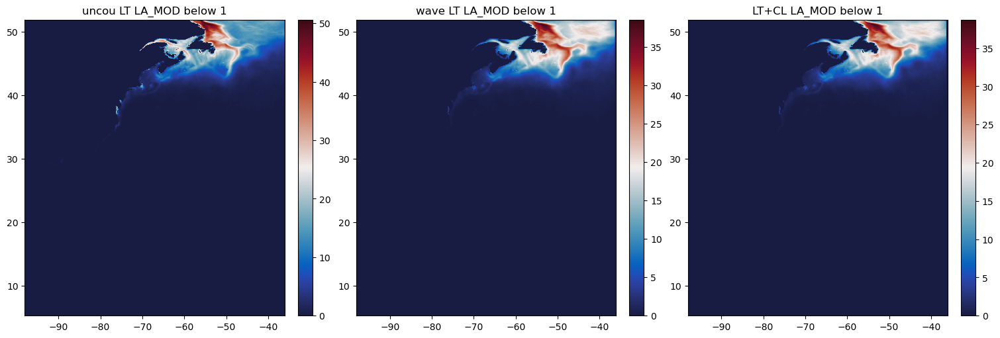

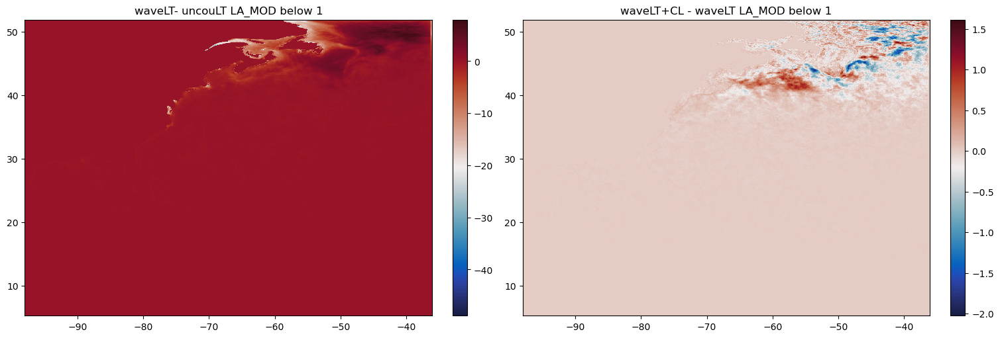

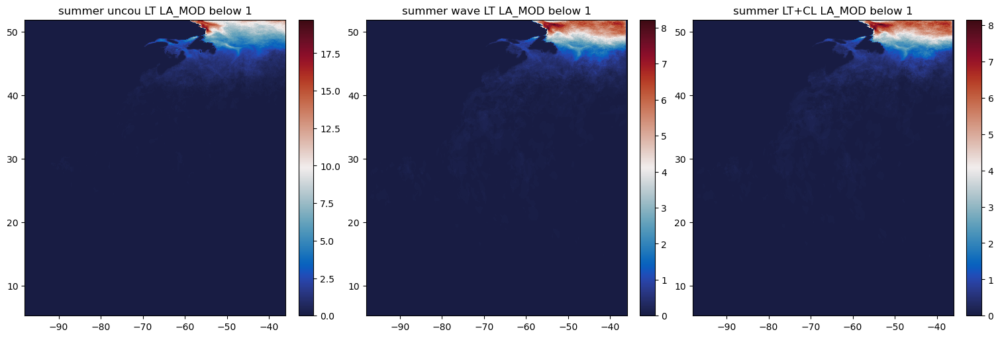

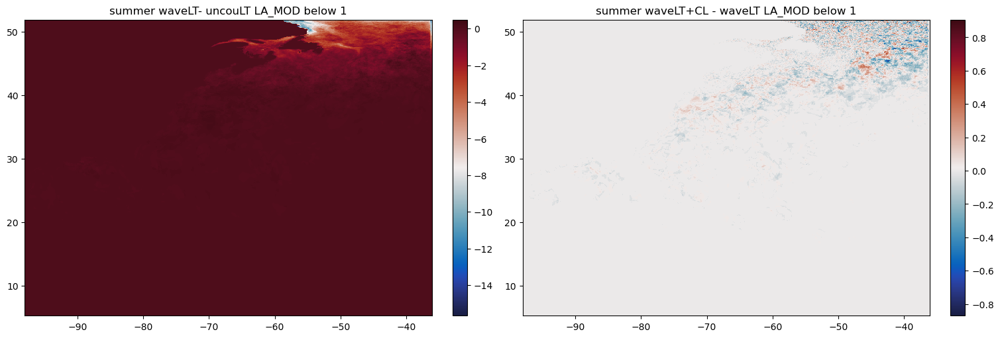

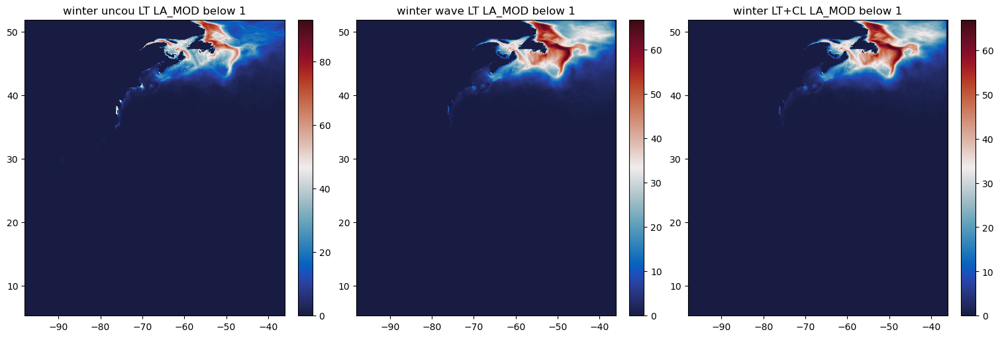

...

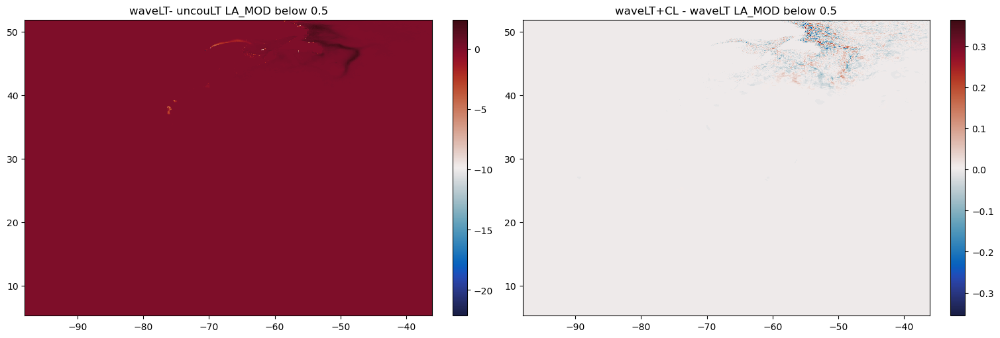

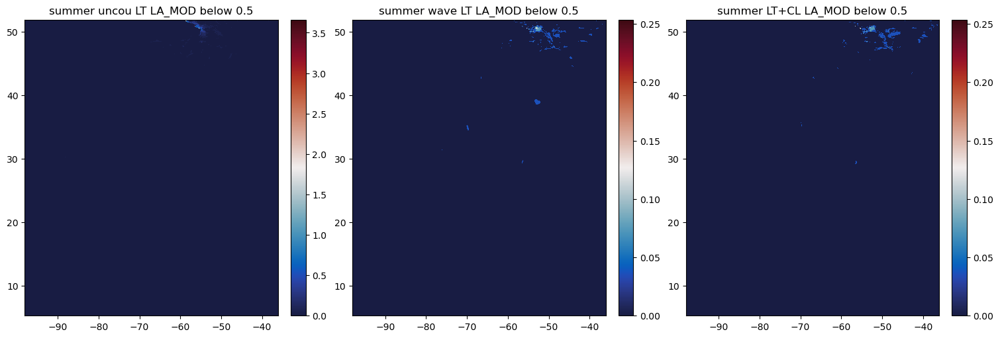

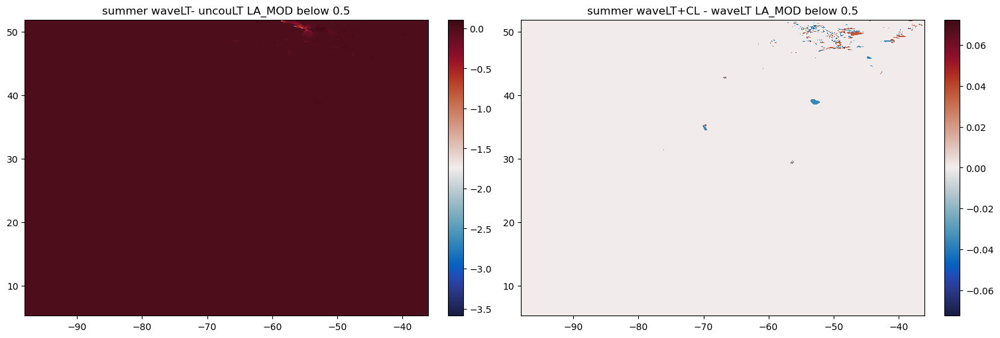

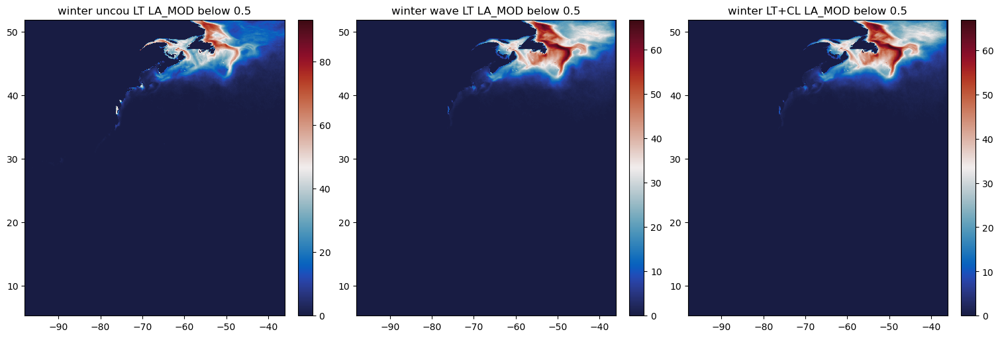

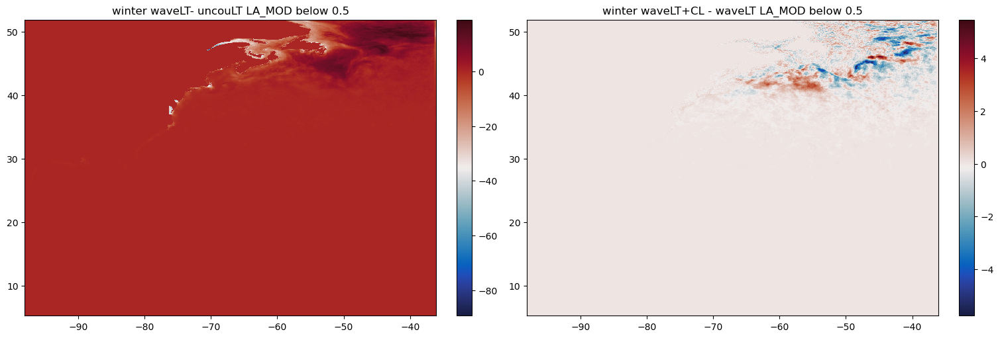

In [8]:
uncou=percentage_below_threshold_uncou['all'][1]['LA_MOD']
wave_6=percentage_below_threshold_wave['all'][1]['LA_MOD']
all_6=percentage_below_threshold_all['all'][1]['LA_MOD']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, uncou, cmap=cmap, shading='auto')
axes[0].set_title('uncou LT LA_MOD below 1')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[1].set_title('wave LT LA_MOD below 1')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[2].set_title('LT+CL LA_MOD below 1')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot
plt.show()

diff_uncou=wave_6-uncou
diff_all=all_6-wave_6
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_uncou , cmap=cmap, shading='auto')
axes[0].set_title('waveLT- uncouLT LA_MOD below 1')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[1].set_title('waveLT+CL - waveLT LA_MOD below 1')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot
plt.show()


uncou=percentage_below_threshold_uncou['summer'][1]['LA_MOD']
wave_6=percentage_below_threshold_wave['summer'][1]['LA_MOD']
all_6=percentage_below_threshold_all['summer'][1]['LA_MOD']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, uncou, cmap=cmap, shading='auto')
axes[0].set_title('summer uncou LT LA_MOD below 1')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[1].set_title('summer wave LT LA_MOD below 1')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[2].set_title('summer LT+CL LA_MOD below 1')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot
plt.show()

diff_uncou=wave_6-uncou
diff_all=all_6-wave_6
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_uncou , cmap=cmap, shading='auto')
axes[0].set_title('summer waveLT- uncouLT LA_MOD below 1')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[1].set_title('summer waveLT+CL - waveLT LA_MOD below 1')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot
plt.show()

uncou=percentage_below_threshold_uncou['winter'][1]['LA_MOD']
wave_6=percentage_below_threshold_wave['winter'][1]['LA_MOD']
all_6=percentage_below_threshold_all['winter'][1]['LA_MOD']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, uncou, cmap=cmap, shading='auto')
axes[0].set_title('winter uncou LT LA_MOD below 1')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[1].set_title('winter wave LT LA_MOD below 1')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[2].set_title('winter LT+CL LA_MOD below 1')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot
plt.show()

diff_uncou=wave_6-uncou
diff_all=all_6-wave_6
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_uncou , cmap=cmap, shading='auto')
axes[0].set_title('winter waveLT- uncouLT LA_MOD below 1')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[1].set_title('winter waveLT+CL - waveLT LA_MOD below 1')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot
plt.show()




uncou=percentage_below_threshold_uncou['all'][0.5]['LA_MOD']
wave_6=percentage_below_threshold_wave['all'][0.5]['LA_MOD']
all_6=percentage_below_threshold_all['all'][0.5]['LA_MOD']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, uncou, cmap=cmap, shading='auto')
axes[0].set_title('uncou LT LA_MOD below 0.5')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[1].set_title('wave LT LA_MOD below 0.5')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[2].set_title('LT+CL LA_MOD below 0.5')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot
plt.show()

diff_uncou=wave_6-uncou
diff_all=all_6-wave_6
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_uncou , cmap=cmap, shading='auto')
axes[0].set_title('waveLT- uncouLT LA_MOD below 0.5')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[1].set_title('waveLT+CL - waveLT LA_MOD below 0.5')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot
plt.show()

uncou=percentage_below_threshold_uncou['summer'][0.5]['LA_MOD']
wave_6=percentage_below_threshold_wave['summer'][0.5]['LA_MOD']
all_6=percentage_below_threshold_all['summer'][0.5]['LA_MOD']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, uncou, cmap=cmap, shading='auto')
axes[0].set_title('summer uncou LT LA_MOD below 0.5')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[1].set_title('summer wave LT LA_MOD below 0.5')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[2].set_title('summer LT+CL LA_MOD below 0.5')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot
plt.show()

diff_uncou=wave_6-uncou
diff_all=all_6-wave_6
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_uncou , cmap=cmap, shading='auto')
axes[0].set_title('summer waveLT- uncouLT LA_MOD below 0.5')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[1].set_title('summer waveLT+CL - waveLT LA_MOD below 0.5')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot
plt.show()

uncou=percentage_below_threshold_uncou['winter'][1]['LA_MOD']
wave_6=percentage_below_threshold_wave['winter'][1]['LA_MOD']
all_6=percentage_below_threshold_all['winter'][1]['LA_MOD']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, uncou, cmap=cmap, shading='auto')
axes[0].set_title('winter uncou LT LA_MOD below 0.5')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[1].set_title('winter wave LT LA_MOD below 0.5')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[2].set_title('winter LT+CL LA_MOD below 0.5')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot
plt.show()

diff_uncou=wave_6-uncou
diff_all=all_6-wave_6
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_uncou , cmap=cmap, shading='auto')
axes[0].set_title('winter waveLT- uncouLT LA_MOD below 0.5')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[1].set_title('winter waveLT+CL - waveLT LA_MOD below 0.5')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot
plt.show()

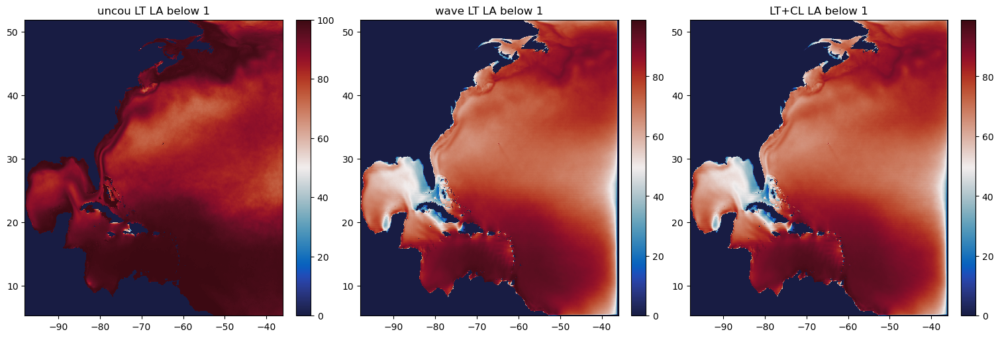

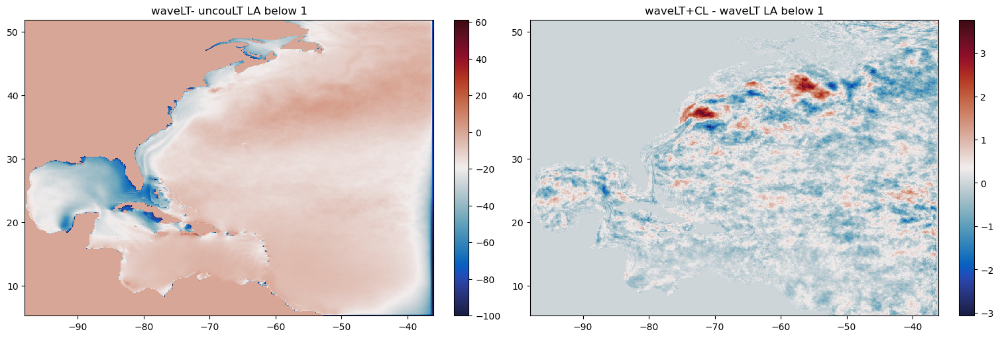

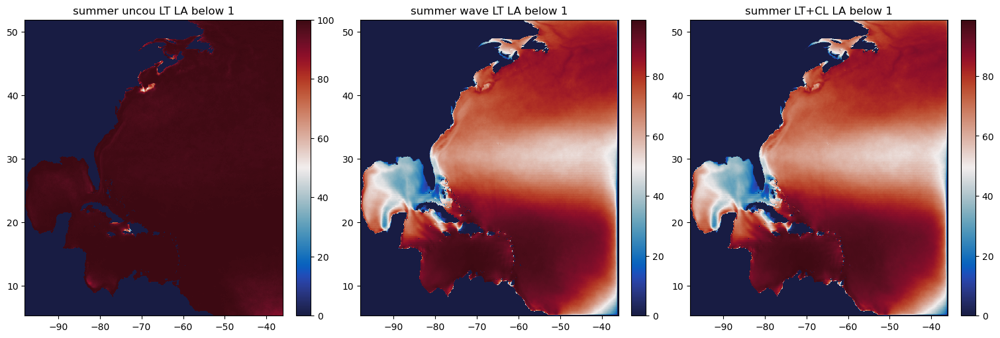

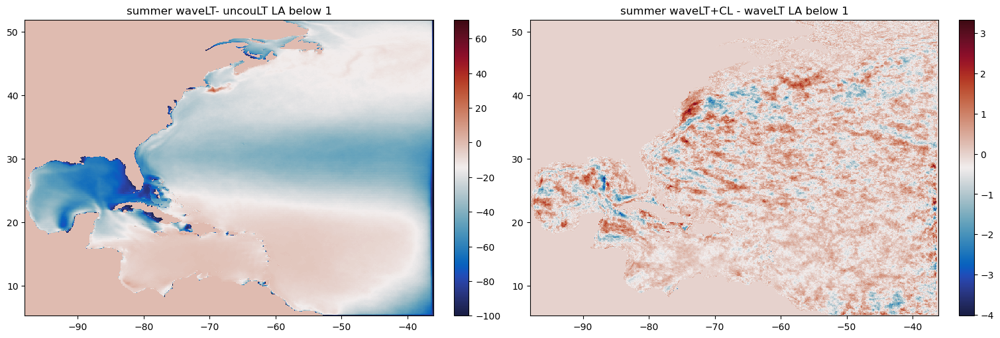

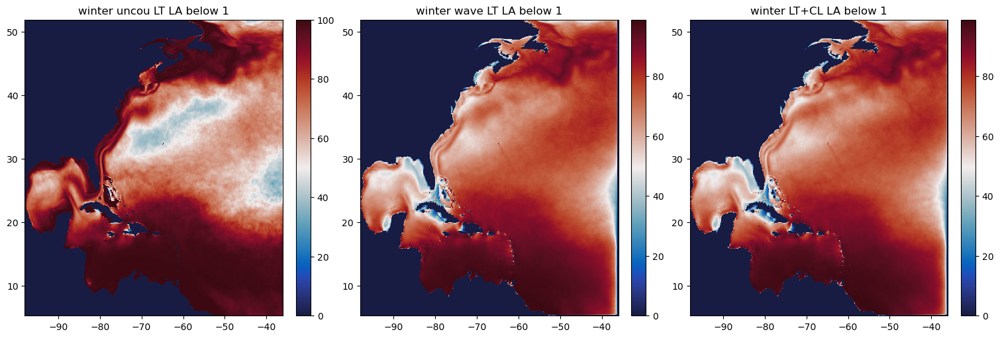

...

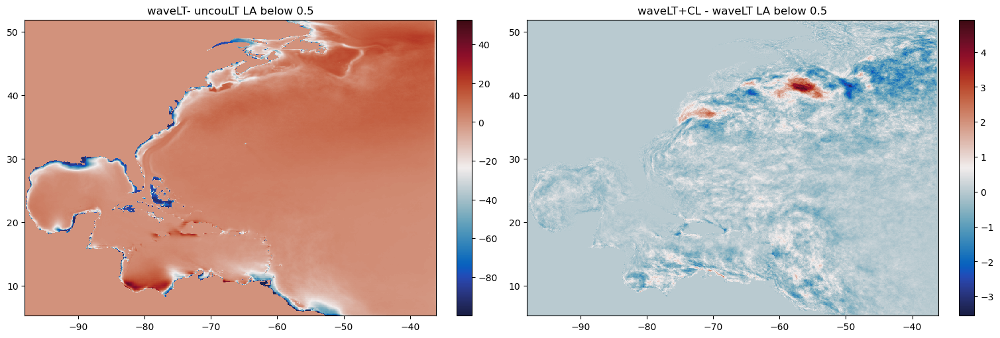

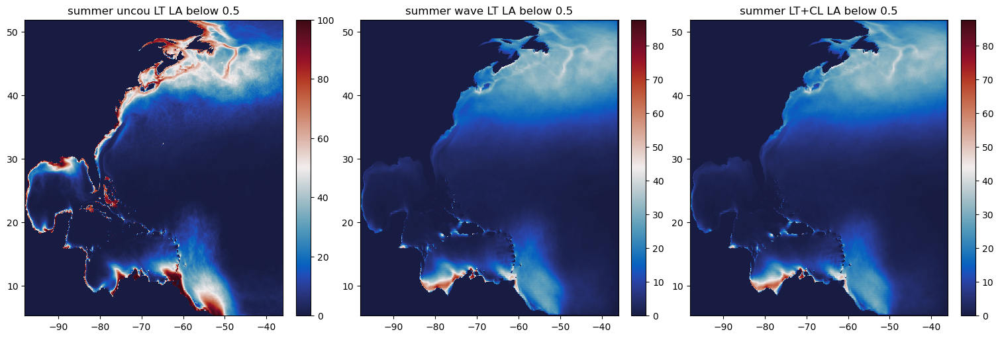

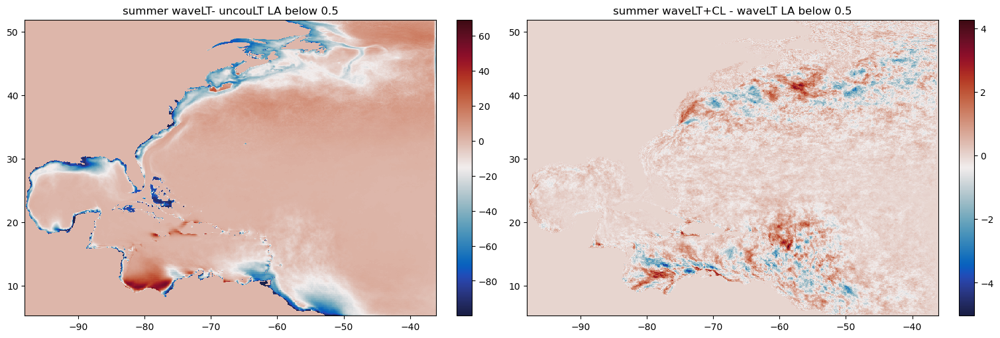

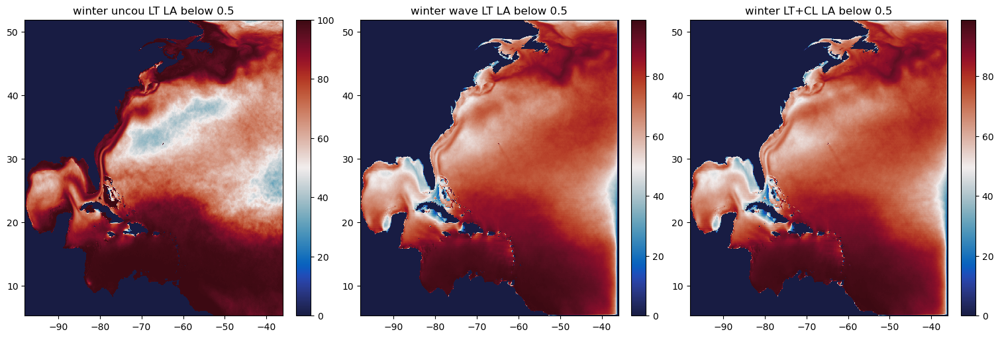

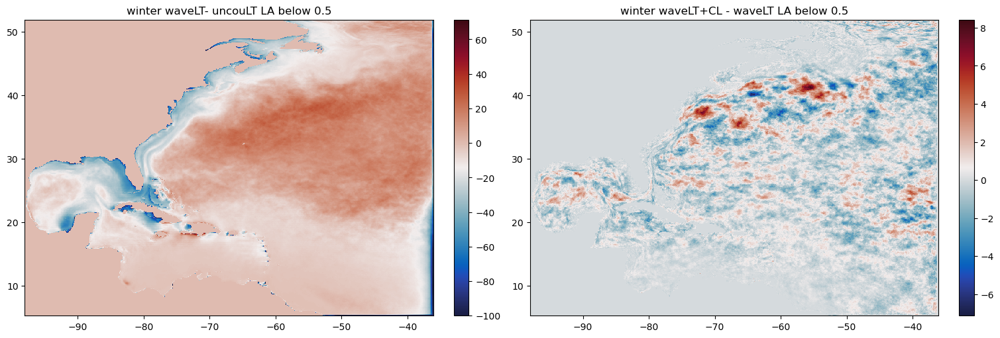

In [9]:
uncou=percentage_below_threshold_uncou['all'][1]['LA']
wave_6=percentage_below_threshold_wave['all'][1]['LA']
all_6=percentage_below_threshold_all['all'][1]['LA']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, uncou, cmap=cmap, shading='auto')
axes[0].set_title('uncou LT LA below 1')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[1].set_title('wave LT LA below 1')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[2].set_title('LT+CL LA below 1')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot
plt.show()

diff_uncou=wave_6-uncou
diff_all=all_6-wave_6
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_uncou , cmap=cmap, shading='auto')
axes[0].set_title('waveLT- uncouLT LA below 1')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[1].set_title('waveLT+CL - waveLT LA below 1')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot
plt.show()


uncou=percentage_below_threshold_uncou['summer'][1]['LA']
wave_6=percentage_below_threshold_wave['summer'][1]['LA']
all_6=percentage_below_threshold_all['summer'][1]['LA']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, uncou, cmap=cmap, shading='auto')
axes[0].set_title('summer uncou LT LA below 1')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[1].set_title('summer wave LT LA below 1')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[2].set_title('summer LT+CL LA below 1')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot
plt.show()

diff_uncou=wave_6-uncou
diff_all=all_6-wave_6
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_uncou , cmap=cmap, shading='auto')
axes[0].set_title('summer waveLT- uncouLT LA below 1')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[1].set_title('summer waveLT+CL - waveLT LA below 1')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot
plt.show()

uncou=percentage_below_threshold_uncou['winter'][1]['LA']
wave_6=percentage_below_threshold_wave['winter'][1]['LA']
all_6=percentage_below_threshold_all['winter'][1]['LA']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, uncou, cmap=cmap, shading='auto')
axes[0].set_title('winter uncou LT LA below 1')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[1].set_title('winter wave LT LA below 1')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[2].set_title('winter LT+CL LA below 1')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot
plt.show()

diff_uncou=wave_6-uncou
diff_all=all_6-wave_6
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_uncou , cmap=cmap, shading='auto')
axes[0].set_title('winter waveLT- uncouLT LA below 1')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[1].set_title('winter waveLT+CL - waveLT LA below 1')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot
plt.show()




uncou=percentage_below_threshold_uncou['all'][0.5]['LA']
wave_6=percentage_below_threshold_wave['all'][0.5]['LA']
all_6=percentage_below_threshold_all['all'][0.5]['LA']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, uncou, cmap=cmap, shading='auto')
axes[0].set_title('uncou LT LA below 0.5')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[1].set_title('wave LT LA below 0.5')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[2].set_title('LT+CL LA below 0.5')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot
plt.show()

diff_uncou=wave_6-uncou
diff_all=all_6-wave_6
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_uncou , cmap=cmap, shading='auto')
axes[0].set_title('waveLT- uncouLT LA below 0.5')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[1].set_title('waveLT+CL - waveLT LA below 0.5')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot
plt.show()

uncou=percentage_below_threshold_uncou['summer'][0.5]['LA']
wave_6=percentage_below_threshold_wave['summer'][0.5]['LA']
all_6=percentage_below_threshold_all['summer'][0.5]['LA']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, uncou, cmap=cmap, shading='auto')
axes[0].set_title('summer uncou LT LA below 0.5')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[1].set_title('summer wave LT LA below 0.5')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[2].set_title('summer LT+CL LA below 0.5')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot
plt.show()

diff_uncou=wave_6-uncou
diff_all=all_6-wave_6
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_uncou , cmap=cmap, shading='auto')
axes[0].set_title('summer waveLT- uncouLT LA below 0.5')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[1].set_title('summer waveLT+CL - waveLT LA below 0.5')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot
plt.show()

uncou=percentage_below_threshold_uncou['winter'][1]['LA']
wave_6=percentage_below_threshold_wave['winter'][1]['LA']
all_6=percentage_below_threshold_all['winter'][1]['LA']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, uncou, cmap=cmap, shading='auto')
axes[0].set_title('winter uncou LT LA below 0.5')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

# Plot the second dataset
mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[1].set_title('winter wave LT LA below 0.5')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot

mesh3 = axes[2].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[2].set_title('winter LT+CL LA below 0.5')
plt.colorbar(mesh3, ax=axes[2])  # Add colorbar for the second plot
plt.show()

diff_uncou=wave_6-uncou
diff_all=all_6-wave_6
fig, axes = plt.subplots(1, 2, figsize=(15, 5), constrained_layout=True)
mesh1 = axes[0].pcolormesh(model_grid_x, model_grid_y, diff_uncou , cmap=cmap, shading='auto')
axes[0].set_title('winter waveLT- uncouLT LA below 0.5')
plt.colorbar(mesh1, ax=axes[0])  # Add colorbar for the first plot

mesh2 = axes[1].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[1].set_title('winter waveLT+CL - waveLT LA below 0.5')
plt.colorbar(mesh2, ax=axes[1])  # Add colorbar for the second plot
plt.show()

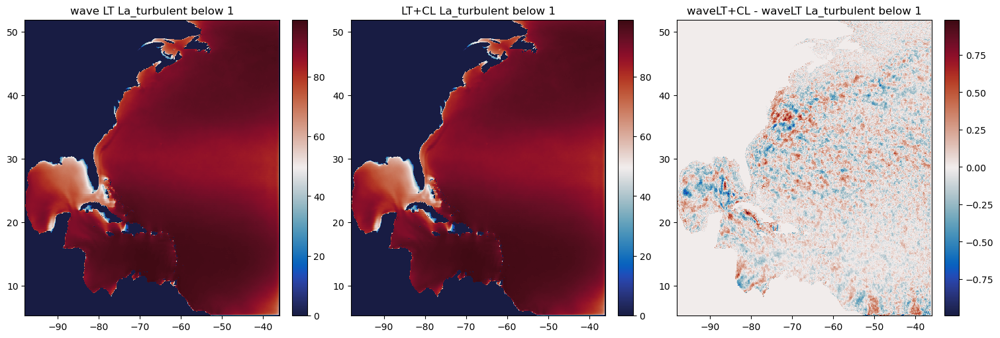

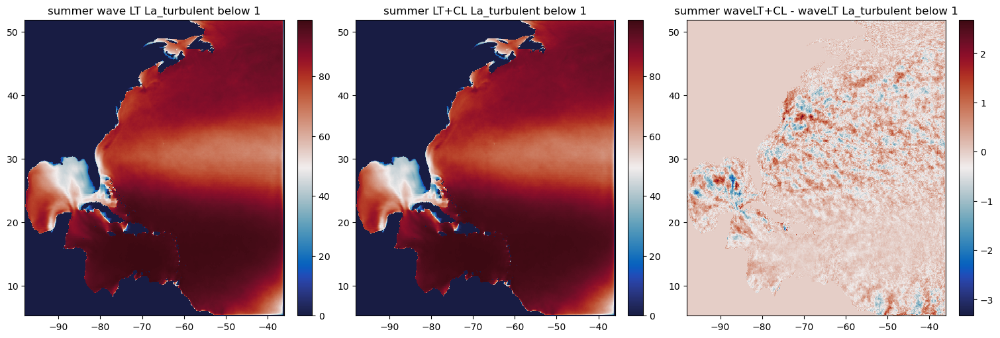

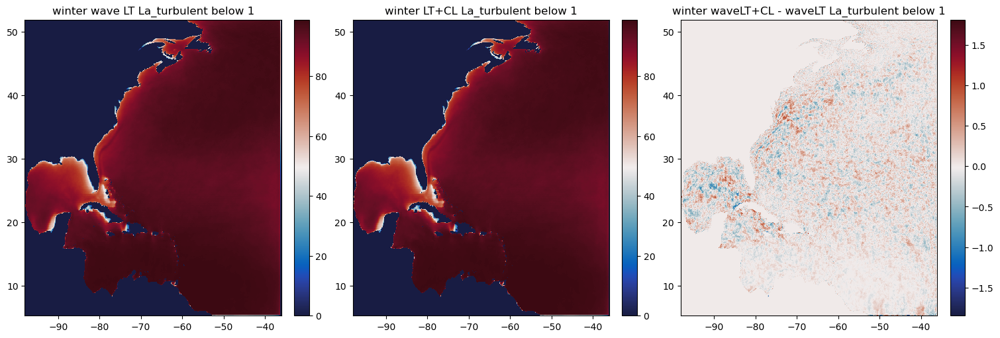

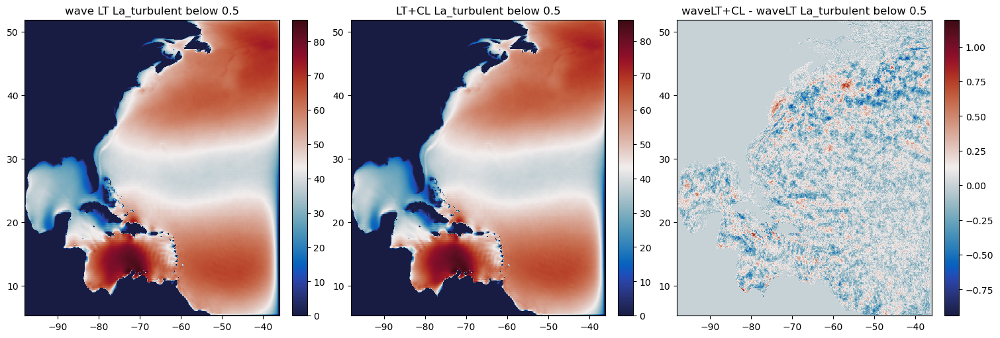

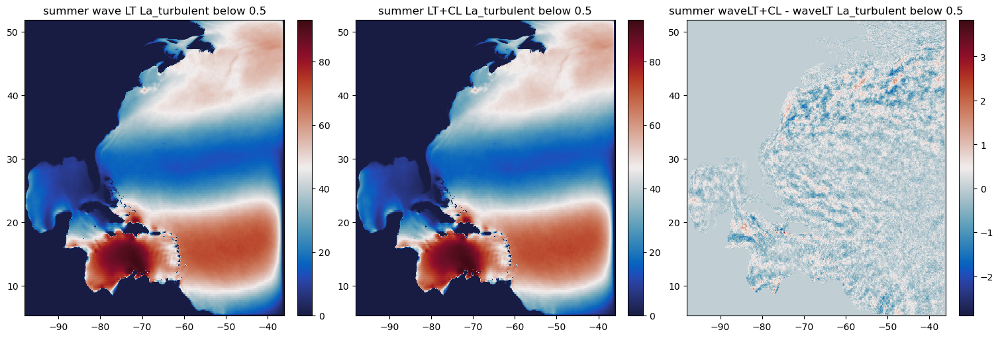

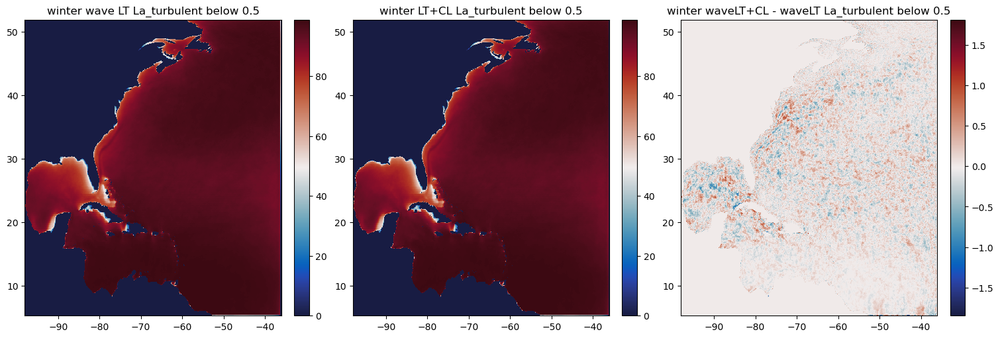

In [12]:

wave_6=percentage_below_threshold_wave['all'][1]['La_turbulent']
all_6=percentage_below_threshold_all['all'][1]['La_turbulent']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the second dataset
mesh2 = axes[0].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[0].set_title('wave LT La_turbulent below 1')
plt.colorbar(mesh2, ax=axes[0])  # Add colorbar for the second plot

mesh3 = axes[1].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[1].set_title('LT+CL La_turbulent below 1')
plt.colorbar(mesh3, ax=axes[1])  # Add colorbar for the second plot


diff_all=all_6-wave_6
mesh2 = axes[2].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[2].set_title('waveLT+CL - waveLT La_turbulent below 1')
plt.colorbar(mesh2, ax=axes[2])  # Add colorbar for the second plot
plt.show()



wave_6=percentage_below_threshold_wave['summer'][1]['La_turbulent']
all_6=percentage_below_threshold_all['summer'][1]['La_turbulent']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the second dataset
mesh2 = axes[0].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[0].set_title('summer wave LT La_turbulent below 1')
plt.colorbar(mesh2, ax=axes[0])  # Add colorbar for the second plot

mesh3 = axes[1].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[1].set_title('summer LT+CL La_turbulent below 1')
plt.colorbar(mesh3, ax=axes[1])  # Add colorbar for the second plot



diff_all=all_6-wave_6
mesh2 = axes[2].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[2].set_title('summer waveLT+CL - waveLT La_turbulent below 1')
plt.colorbar(mesh2, ax=axes[2])  # Add colorbar for the second plot
plt.show()


wave_6=percentage_below_threshold_wave['winter'][1]['La_turbulent']
all_6=percentage_below_threshold_all['winter'][1]['La_turbulent']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the second dataset
mesh2 = axes[0].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[0].set_title('winter wave LT La_turbulent below 1')
plt.colorbar(mesh2, ax=axes[0])  # Add colorbar for the second plot

mesh3 = axes[1].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[1].set_title('winter LT+CL La_turbulent below 1')
plt.colorbar(mesh3, ax=axes[1])  # Add colorbar for the second plot


diff_all=all_6-wave_6


mesh2 = axes[2].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[2].set_title('winter waveLT+CL - waveLT La_turbulent below 1')
plt.colorbar(mesh2, ax=axes[2])  # Add colorbar for the second plot
plt.show()





wave_6=percentage_below_threshold_wave['all'][0.5]['La_turbulent']
all_6=percentage_below_threshold_all['all'][0.5]['La_turbulent']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)


# Plot the second dataset
mesh2 = axes[0].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[0].set_title('wave LT La_turbulent below 0.5')
plt.colorbar(mesh2, ax=axes[0])  # Add colorbar for the second plot

mesh3 = axes[1].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[1].set_title('LT+CL La_turbulent below 0.5')
plt.colorbar(mesh3, ax=axes[1])  # Add colorbar for the second plot

diff_all=all_6-wave_6
mesh2 = axes[2].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[2].set_title('waveLT+CL - waveLT La_turbulent below 0.5')
plt.colorbar(mesh2, ax=axes[2])  # Add colorbar for the second plot
plt.show()


wave_6=percentage_below_threshold_wave['summer'][0.5]['La_turbulent']
all_6=percentage_below_threshold_all['summer'][0.5]['La_turbulent']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)

# Plot the second dataset
mesh2 = axes[0].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[0].set_title('summer wave LT La_turbulent below 0.5')
plt.colorbar(mesh2, ax=axes[0])  # Add colorbar for the second plot

mesh3 = axes[1].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[1].set_title('summer LT+CL La_turbulent below 0.5')
plt.colorbar(mesh3, ax=axes[1])  # Add colorbar for the second plot


diff_all=all_6-wave_6

mesh2 = axes[2].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[2].set_title('summer waveLT+CL - waveLT La_turbulent below 0.5')
plt.colorbar(mesh2, ax=axes[2])  # Add colorbar for the second plot
plt.show()


wave_6=percentage_below_threshold_wave['winter'][1]['La_turbulent']
all_6=percentage_below_threshold_all['winter'][1]['La_turbulent']

fig, axes = plt.subplots(1, 3, figsize=(15, 5), constrained_layout=True)


# Plot the second dataset
mesh2 = axes[0].pcolormesh(model_grid_x, model_grid_y, wave_6, cmap=cmap, shading='auto')
axes[0].set_title('winter wave LT La_turbulent below 0.5')
plt.colorbar(mesh2, ax=axes[0])  # Add colorbar for the second plot

mesh3 = axes[1].pcolormesh(model_grid_x, model_grid_y, all_6, cmap=cmap, shading='auto')
axes[1].set_title('winter LT+CL La_turbulent below 0.5')
plt.colorbar(mesh3, ax=axes[1])  # Add colorbar for the second plot

diff_all=all_6-wave_6

mesh2 = axes[2].pcolormesh(model_grid_x, model_grid_y, diff_all, cmap=cmap, shading='auto')
axes[2].set_title('winter waveLT+CL - waveLT La_turbulent below 0.5')
plt.colorbar(mesh2, ax=axes[2])  # Add colorbar for the second plot
plt.show()